In [10]:
import os
from PIL import Image
dataset_path = '../dataset-fruits/images/'

In [85]:
image_transforms = transforms.Compose([
        transforms.Resize((256, 256)), # LETTERBOX, optimal resize
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

class ImagesFromFolder:
    def __init__(self, images_path, transforms=None):
        self.images_path = images_path
        self.labels = [x for x in os.listdir(self.images_path) if x != '.DS_Store']
        self.images = []
        self.transforms = transforms
        for image_label in self.labels:
            if '.DS_Store' == image_label:
                continue
            for image_name in os.listdir(os.path.join(self.images_path, image_label)):
                image_path = os.path.join(self.images_path, image_label, image_name)
                self.images += [(image_path, image_label)]

    def __getitem__(self, index):
        image_path, label = self.images[index]
        image = Image.open(image_path)
        if image.mode != 'RGB':
            image = image.convert('RGB')
        if self.transforms is not None:
            image = self.transforms(image)
        label = self.labels.index(label)
        return image, label

    def __len__(self):
        return len(self.images)

In [86]:
dataset = ImagesFromFolder(dataset_path, image_transforms)

In [75]:
# dataset.labels.index('')

In [107]:
import torch
from torch import nn
from torchvision import datasets, models, transforms

class ResNetFeatureExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = models.resnet18(weights='IMAGENET1K_V1')
        self.model.eval()
    
    @torch.no_grad()
    def inference(self, x):
        x = self.model.conv1(x)
        x = self.model.bn1(x)
        x = self.model.relu(x)
        x = self.model.maxpool(x)

        x = self.model.layer1(x)
        x = self.model.layer2(x)
        x = self.model.layer3(x)
        x = self.model.layer4(x)

        x = self.model.avgpool(x)

        return x

In [108]:
model = ResNetFeatureExtractor()

In [109]:
image_to_inference = dataset[0][0].unsqueeze(0)
# model.inference(dataset[0][0])

In [110]:
model.inference(image_to_inference).flatten().shape

torch.Size([262144])

In [87]:
from tqdm.notebook import tqdm

vector_dataset = []
new_labels = []
for image, label in tqdm(dataset):
    image = image.unsqueeze(0)
    feature_vector = model.inference(image)
    vector_dataset.append(feature_vector)
    new_labels.append(label)


  0%|          | 0/360 [00:00<?, ?it/s]

In [90]:
np.stack(vector_dataset)[:,0,:,0,0].shape

(360, 512)

In [66]:
dataset_no_transforms = ImagesFromFolder(dataset_path)

In [69]:
import numpy as np
## NAIVE VECTOR
np.array(dataset_no_transforms[0][0]).flatten()

array([186, 216, 216, ..., 240, 251, 253], shape=(23970816,), dtype=uint8)

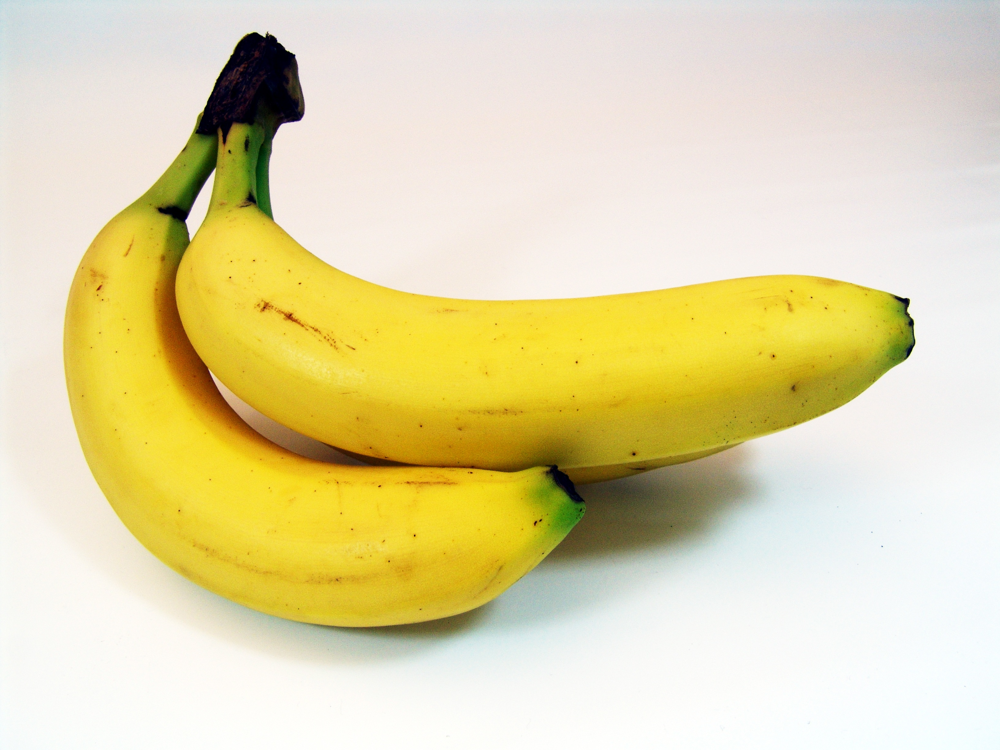

In [91]:
dataset_no_transforms[0][0]